In [1]:
import os
import cv2 as cv
import matplotlib.pyplot as plt
import openpyxl
import multiprocessing
import time
import pyautogui

In [2]:
#read image
img = cv.imread("C:/Users/ACER/Documents/bad apple frame/bad apple frame0478.jpg")

In [89]:
#resolution
img.shape

(360, 480, 3)

In [45]:
#pixel count
img.size

172800

In [95]:
#check grayscale intensity at specific pixel
img[100, 100]

array([223, 223, 223], dtype=uint8)

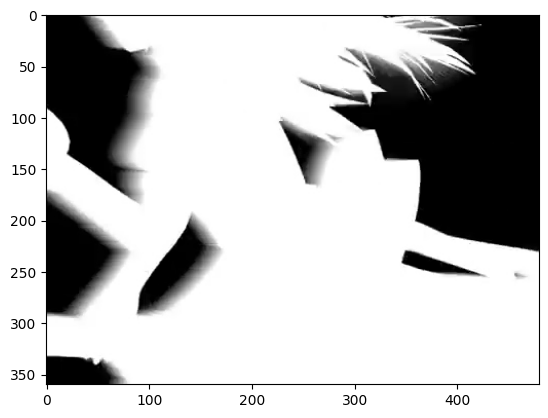

In [86]:
plt.imshow(img, "gray")

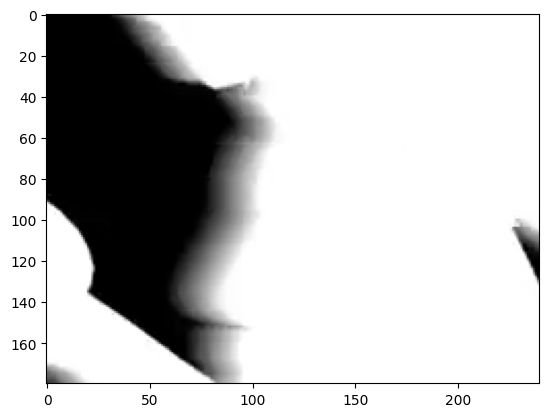

In [55]:
plt.imshow(img[:180, :240], "gray")

In [3]:
#change array to list
img_list = img.tolist()

In [111]:
img.tolist()

[[[0, 0, 0],
  [0, 0, 0],
  [0, 0, 0],
  [0, 0, 0],
  [0, 0, 0],
  [0, 0, 0],
  [0, 0, 0],
  [0, 0, 0],
  [0, 0, 0],
  [0, 0, 0],
  [0, 0, 0],
  [0, 0, 0],
  [0, 0, 0],
  [0, 0, 0],
  [0, 0, 0],
  [0, 0, 0],
  [1, 1, 1],
  [1, 1, 1],
  [1, 1, 1],
  [1, 1, 1],
  [1, 1, 1],
  [1, 1, 1],
  [1, 1, 1],
  [1, 1, 1],
  [1, 1, 1],
  [1, 1, 1],
  [1, 1, 1],
  [1, 1, 1],
  [0, 0, 0],
  [2, 2, 2],
  [6, 6, 6],
  [8, 8, 8],
  [49, 49, 49],
  [56, 56, 56],
  [66, 66, 66],
  [83, 83, 83],
  [97, 97, 97],
  [107, 107, 107],
  [119, 119, 119],
  [133, 133, 133],
  [143, 143, 143],
  [149, 149, 149],
  [158, 158, 158],
  [175, 175, 175],
  [190, 190, 190],
  [195, 195, 195],
  [204, 204, 204],
  [214, 214, 214],
  [220, 220, 220],
  [229, 229, 229],
  [238, 238, 238],
  [253, 253, 253],
  [252, 252, 252],
  [255, 255, 255],
  [255, 255, 255],
  [255, 255, 255],
  [255, 255, 255],
  [255, 255, 255],
  [254, 254, 254],
  [254, 254, 254],
  [255, 255, 255],
  [255, 255, 255],
  [254, 254, 254],
  [255, 25

In [4]:
#init workbook
wb = openpyxl.Workbook()
ws = wb.active

In [82]:
for row in img_list:
    ws.append(row)

In [84]:
wb.save("frame 0478.xlsx")

In [5]:
#func to convert BGR (wtf opencv) val to hex
def rgb_to_hex(array):
    return "{:02x}{:02x}{:02x}".format(array[2], array[1], array[0])

In [103]:
rgb_to_hex(img[100,100])

'#dfdfdf'

In [6]:
#convert BGR (wtf opncv) val to hex and append to a list
image_hex = []

for j in range(360):
    row_hex = []
    for i in range(480):
        row_hex.append("ff" + rgb_to_hex(img[j, i]))
    image_hex.append(row_hex)

In [116]:
image_hex

[['ff000000',
  'ff000000',
  'ff000000',
  'ff000000',
  'ff000000',
  'ff000000',
  'ff000000',
  'ff000000',
  'ff000000',
  'ff000000',
  'ff000000',
  'ff000000',
  'ff000000',
  'ff000000',
  'ff000000',
  'ff000000',
  'ff010101',
  'ff010101',
  'ff010101',
  'ff010101',
  'ff010101',
  'ff010101',
  'ff010101',
  'ff010101',
  'ff010101',
  'ff010101',
  'ff010101',
  'ff010101',
  'ff000000',
  'ff020202',
  'ff060606',
  'ff080808',
  'ff313131',
  'ff383838',
  'ff424242',
  'ff535353',
  'ff616161',
  'ff6b6b6b',
  'ff777777',
  'ff858585',
  'ff8f8f8f',
  'ff959595',
  'ff9e9e9e',
  'ffafafaf',
  'ffbebebe',
  'ffc3c3c3',
  'ffcccccc',
  'ffd6d6d6',
  'ffdcdcdc',
  'ffe5e5e5',
  'ffeeeeee',
  'fffdfdfd',
  'fffcfcfc',
  'ffffffff',
  'ffffffff',
  'ffffffff',
  'ffffffff',
  'ffffffff',
  'fffefefe',
  'fffefefe',
  'ffffffff',
  'ffffffff',
  'fffefefe',
  'ffffffff',
  'fffefefe',
  'fffefefe',
  'fffefefe',
  'fffefefe',
  'fffefefe',
  'fffefefe',
  'fffefefe',
  'fff

In [8]:
wb1 = openpyxl.Workbook()
ws1 = wb1.active

In [118]:
len(image_hex)

360

In [9]:
#color each cell according to their respective hex value
i = 0
j = 0

#360 = vertical pixels
for j in range(360):
    i=0
    for columns in ws1[f"A{j+1}:RL{j+1}"]:
        for cell in columns:
            cell.fill = openpyxl.styles.PatternFill("solid", start_color=image_hex[j][i])
            i += 1

In [168]:
wb1.save("frame 0478.xlsx")

In [2]:
wb2 = openpyxl.load_workbook(r"frame 0478.xlsx")
ws2 = wb2.active

In [4]:
#Resize rowheights
for i in range(ws2.max_row):
    ws2.row_dimensions[i+1].height = 11.25

#Resize colwidths
for cols in range(480):
    ws2.column_dimensions[f"{openpyxl.utils.get_column_letter(cols+1)}"].width = 2.14

In [109]:
#save to root directory
wb2.save("frame 0478_res.xlsx")

In [5]:
#save to /frames/ directory (gitignore)
wb2.save(r"frames/frame 0478_res.xlsx")

In [7]:
framameslist = os.listdir("C:/Users/ACER/Documents/bad apple frame")
len(framameslist)

6571

# COMPILED

In [8]:
import random

In [64]:
frameno = str(random.randint(0,999))
frameno = frameno.zfill(4)
print(frameno)

0263


In [65]:
img2 = cv.imread(f"C:/Users/ACER/Documents/bad apple frame/bad apple frame{frameno}.jpg")

In [13]:
img2_list = img2.tolist()

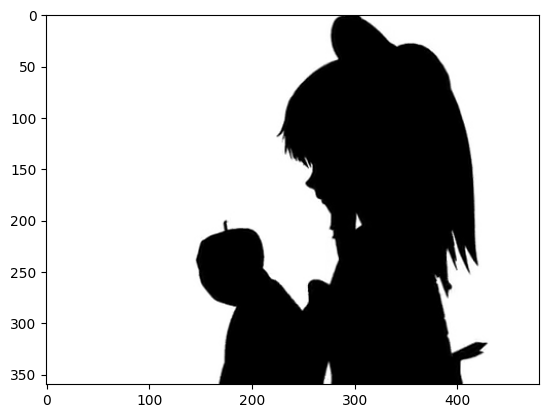

In [66]:
plt.imshow(img2)

In [17]:
wb3 = openpyxl.Workbook()
ws3 = wb3.active
ws3.title = "4531"

In [18]:
def rgb_to_hex(array):
    return "{:02x}{:02x}{:02x}".format(array[2], array[1], array[0])

In [20]:
#convert BGR (wtf opncv) val to hex and append to a list
image_hex2 = []

for j in range(360):
    row_hex = []
    for i in range(480):
        row_hex.append("ff" + rgb_to_hex(img2[j, i]))
    image_hex2.append(row_hex)

In [22]:
#color each cell according to their respective hex value
i = 0
j = 0

#360 = vertical pixels
for j in range(360):
    i=0
    for columns in ws3[f"A{j+1}:RL{j+1}"]:
        for cell in columns:
            cell.fill = openpyxl.styles.PatternFill("solid", start_color=image_hex2[j][i])
            i += 1

In [23]:
#Resize rowheights
for i in range(ws3.max_row):
    ws3.row_dimensions[i+1].height = 11.25

#Resize colwidths
for cols in range(480):
    ws3.column_dimensions[f"{openpyxl.utils.get_column_letter(cols+1)}"].width = 2.14

In [28]:
#save to /frames/ directory (gitignore)
wb3.save(r"frames/frame 4531_res.xlsx")

loop through first 360 frames

In [12]:
frames = os.listdir("C:/Users/ACER/Documents/bad apple frame")
frames360 = frames[:360]

In [5]:
i = 0

def rgb_to_hex(array):
    return "{:02x}{:02x}{:02x}".format(array[2], array[1], array[0])

for files in os.listdir("C:/Users/ACER/Documents/bad apple frame"):
    #first 360 frames
    if i < 360:
        
        #Read files
        image = cv.imread(f"C:/Users/ACER/Documents/bad apple frame/{files}")
        image_list = image.tolist()
        
        #make worksheet
        wb4 = openpyxl.Workbook()
        ws4 = wb4.active
        #sheet name = frame number
        ws4.title = f"{str(i).zfill(4)}"

        #convert BGR (wtf opncv) val to hex and append to a list
        image_hex3 = []

        for j in range(360):
            row_hex = []
            for k in range(480):
                row_hex.append("ff" + rgb_to_hex(image[j, k]))
            image_hex3.append(row_hex)
        
        #color each cell according to their respective hex value
        m = 0
        j = 0

        #360 = vertical pixels
        for j in range(360):
            m=0
            for columns in ws4[f"A{j+1}:RL{j+1}"]:
                for cell in columns:
                    cell.fill = openpyxl.styles.PatternFill("solid", start_color=image_hex3[j][m])
                    m += 1

        #Resize rowheights
        for rows in range(ws4.max_row):
            ws4.row_dimensions[rows+1].height = 11.25

        #Resize colwidths
        for cols in range(480):
            ws4.column_dimensions[f"{openpyxl.utils.get_column_letter(cols+1)}"].width = 2.14

        #save to /frames/ directory (gitignore)
        wb4.save(f"C:/Users/ACER/Documents/GitHub/bad-apple-excel/frames/frame {str(i).zfill(4)}.xlsx")

        i += 1

# Multiprocessing, don't run here, run in .py

In [8]:
multiprocessing.cpu_count()

12

In [19]:
def rgb_to_hex(array):
    return "{:02x}{:02x}{:02x}".format(array[2], array[1], array[0])

def img_to_excel(files):
    #Read files
    image = cv.imread(f"C:/Users/ACER/Documents/bad apple frame/{files}")
    image_list = image.tolist()
    
    #make worksheet
    wb4 = openpyxl.Workbook()
    ws4 = wb4.active
    #sheet name = frame number
    ws4.title = f"{files[-8:-4]}"

    #convert BGR (wtf opncv) val to hex and append to a list
    image_hex3 = []

    for j in range(360):
        row_hex = []
        for k in range(480):
            row_hex.append("ff" + rgb_to_hex(image[j, k]))
        image_hex3.append(row_hex)
    
    #color each cell according to their respective hex value
    m = 0
    j = 0

    #360 = vertical pixels
    for j in range(360):
        m=0
        for columns in ws4[f"A{j+1}:RL{j+1}"]:
            for cell in columns:
                cell.fill = openpyxl.styles.PatternFill("solid", start_color=image_hex3[j][m])
                m += 1

    #Resize rowheights
    for rows in range(ws4.max_row):
        ws4.row_dimensions[rows+1].height = 11.25

    #Resize colwidths
    for cols in range(480):
        ws4.column_dimensions[f"{openpyxl.utils.get_column_letter(cols+1)}"].width = 2.14

    #save to /frames/ directory (gitignore)
    wb4.save(f"C:/Users/ACER/Documents/GitHub/bad-apple-excel/frames/frame {files[-8:-4]}.xlsx")

In [20]:
if __name__ == "__main__":
    frames = os.listdir("C:/Users/ACER/Documents/bad apple frame")
    frames360 = frames[:360] #To iterate through all files just delete this line

    p = multiprocessing.Pool()

    p.map(img_to_excel, frames360)

In [3]:
#check if complete (360 rn)
len(os.listdir("C:/Users/ACER/Documents/GitHub/bad-apple-excel/frames"))

360

In [3]:
a = os.listdir("C:/Users/ACER/Documents/bad apple frame")

In [22]:
os.listdir("C:/Users/ACER/Documents/bad apple frame")

['bad apple frame0000.jpg',
 'bad apple frame0001.jpg',
 'bad apple frame0002.jpg',
 'bad apple frame0003.jpg',
 'bad apple frame0004.jpg',
 'bad apple frame0005.jpg',
 'bad apple frame0006.jpg',
 'bad apple frame0007.jpg',
 'bad apple frame0008.jpg',
 'bad apple frame0009.jpg',
 'bad apple frame0010.jpg',
 'bad apple frame0011.jpg',
 'bad apple frame0012.jpg',
 'bad apple frame0013.jpg',
 'bad apple frame0014.jpg',
 'bad apple frame0015.jpg',
 'bad apple frame0016.jpg',
 'bad apple frame0017.jpg',
 'bad apple frame0018.jpg',
 'bad apple frame0019.jpg',
 'bad apple frame0020.jpg',
 'bad apple frame0021.jpg',
 'bad apple frame0022.jpg',
 'bad apple frame0023.jpg',
 'bad apple frame0024.jpg',
 'bad apple frame0025.jpg',
 'bad apple frame0026.jpg',
 'bad apple frame0027.jpg',
 'bad apple frame0028.jpg',
 'bad apple frame0029.jpg',
 'bad apple frame0030.jpg',
 'bad apple frame0031.jpg',
 'bad apple frame0032.jpg',
 'bad apple frame0033.jpg',
 'bad apple frame0034.jpg',
 'bad apple frame003

In [17]:
a[0][-8:-4]

'0000'

In [18]:
os.listdir("C:/Users/ACER/Documents/bad apple frame")[0][-8:-4]

'0000'

In [27]:
len(os.listdir(r"frames"))

6571

In [29]:
len(os.listdir(("C:/Users/ACER/Documents/bad apple frame")))

6571

In [6]:
os.startfile("C:/Users/ACER/Desktop/test.txt")

In [11]:
os.listdir("C:/Users/ACER/Documents/bad apple frame/")

['bad apple frame0000.jpg',
 'bad apple frame0001.jpg',
 'bad apple frame0002.jpg',
 'bad apple frame0003.jpg',
 'bad apple frame0004.jpg',
 'bad apple frame0005.jpg',
 'bad apple frame0006.jpg',
 'bad apple frame0007.jpg',
 'bad apple frame0008.jpg',
 'bad apple frame0009.jpg',
 'bad apple frame0010.jpg',
 'bad apple frame0011.jpg',
 'bad apple frame0012.jpg',
 'bad apple frame0013.jpg',
 'bad apple frame0014.jpg',
 'bad apple frame0015.jpg',
 'bad apple frame0016.jpg',
 'bad apple frame0017.jpg',
 'bad apple frame0018.jpg',
 'bad apple frame0019.jpg',
 'bad apple frame0020.jpg',
 'bad apple frame0021.jpg',
 'bad apple frame0022.jpg',
 'bad apple frame0023.jpg',
 'bad apple frame0024.jpg',
 'bad apple frame0025.jpg',
 'bad apple frame0026.jpg',
 'bad apple frame0027.jpg',
 'bad apple frame0028.jpg',
 'bad apple frame0029.jpg',
 'bad apple frame0030.jpg',
 'bad apple frame0031.jpg',
 'bad apple frame0032.jpg',
 'bad apple frame0033.jpg',
 'bad apple frame0034.jpg',
 'bad apple frame003

In [2]:
os.startfile("C:/Users/ACER/Documents/GitHub/bad-apple-excel/frames/3710.xlsx")

In [65]:
pyautogui.position()

Point(x=1342, y=12)

In [19]:
pyautogui.moveTo(1342, 12)

In [23]:
pyautogui.click(1342, 752)

In [37]:
pyautogui.press('backspace')

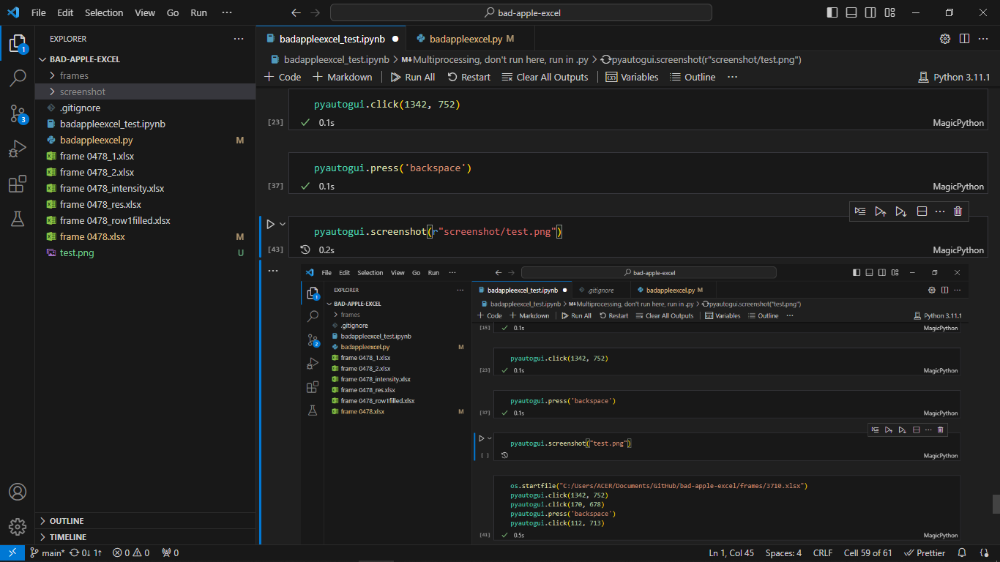

In [44]:
pyautogui.screenshot(r"screenshot/test.png")

In [3]:
testfile = "C:/Users/ACER/Documents/GitHub/bad-apple-excel/frames/5612.xlsx"

In [50]:
testfile

'C:/Users/ACER/Documents/GitHub/bad-apple-excel/frames/3710.xlsx'

In [49]:
testfile[-9:-5]

'3710'

In [ ]:
pyautogui.keyDown("ctrl")
pyautogui.keyDown("shift")
pyautogui.press("f1")
pyautogui.keyUp("ctrl")
pyautogui.keyup("shift")

# CHECK THE EXCEL FILE AFTER RUNNING, HUD WILL STILL BE GONE AND IT WILL FUCK THE FUNCTION UP

In [4]:
#Automate taking screenshot, delays need to be adjusted
os.startfile(testfile)
time.sleep(2.5)
pyautogui.click(1342, 752)
time.sleep(0.05)
pyautogui.click(170, 678, clicks=2)
time.sleep(0.05)
pyautogui.press('backspace')
time.sleep(0.05)
pyautogui.click(112, 713)
time.sleep(0.05)
pyautogui.keyDown("ctrl")
pyautogui.keyDown("shift")
pyautogui.press("f1")
pyautogui.keyUp("ctrl")
pyautogui.keyUp("shift")
time.sleep(0.2)
pyautogui.screenshot(fr"screenshot/{testfile[-9:-5]}.png")
time.sleep(0.05)
pyautogui.click(1342, 12)

In [18]:
for file in os.listdir("C:/Users/ACER/Documents/GitHub/bad-apple-excel/frames")[:10]:
    #Automate taking screenshot, delays need to be adjusted
    os.startfile(f"C:/Users/ACER/Documents/GitHub/bad-apple-excel/frames/{file}")
    time.sleep(2.5)
    pyautogui.click(1342, 752)
    time.sleep(0.05)
    pyautogui.click(170, 678, clicks=2)
    time.sleep(0.05)
    pyautogui.press('backspace')
    time.sleep(0.05)
    pyautogui.click(112, 713)
    time.sleep(0.05)
    pyautogui.keyDown("ctrl")
    pyautogui.keyDown("shift")
    pyautogui.press("f1")
    pyautogui.keyUp("ctrl")
    pyautogui.keyUp("shift")
    time.sleep(0.2)
    pyautogui.screenshot(fr"screenshot/{file[:-5]}.png")
    time.sleep(0.05)
    pyautogui.click(1342, 12)
    time.sleep(0.2)

FailSafeException: PyAutoGUI fail-safe triggered from mouse moving to a corner of the screen. To disable this fail-safe, set pyautogui.FAILSAFE to False. DISABLING FAIL-SAFE IS NOT RECOMMENDED.